<div style="border-radius: 15px; border: 3px solid indigo; padding: 15px;">
<b>Привет, Катя!</b>

Меня зовут Вадим Лепшин, и я буду проверять твой проект. Предлагаю общение на «ты», но если тебе комфортнее на «Вы», обязательно сообщи мне об этом. 

Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе стать аналитиком данных. Тобой проделана большая работа над проектом, давай сделаем его еще лучше. Ниже ты найдешь мои комментарии. Есть несколько правил:<br>
- <b>Пожалуйста, не перемещай, не изменяй и не удаляй комментарии.</b>
- У комментариев могут быть приписки <b>V2, V3</b> и т.д., которые соответствуют версии проверки. 
   
В тетрадке ты можешь встретить 3 вида моих комментариев:
    
<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Комментарии такого цвета необходимо исправить, без их отработки проект не будет принят.
</div>
    
    
<div class="alert alert-warning">
    <b>⚠️ Комментарий ревьюера:</b>
    
На комментарии такого цвета нужно обязательно обратить внимание. Рекомендую учесть их при редактировании проекта и выполнении будущих заданий.
</div>
    
<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Так отмечены удачные решения и подходы, на которые стоит опираться в будущих проектах.
</div>
    
Предлагаю работать над проектом в диалоге: если ты хочешь ответить на мои комментарии — пиши об этом. Мне будет легче отследить изменения, если ты выделишь свои комментарии вот так:

<div class="alert alert-info">
<b> Комментарий студента</b>

Тут текст.
</div>


Всё это поможет выполнить повторную проверку твоего проекта оперативнее.
</div>

<div style="border-radius: 15px; border: 3px solid indigo; padding: 15px;">
    <b>Общий комментарий ревьюера:</b>
    
Мне понравилась твоя работа, Катя. Ты отлично справилась с визуализацией, но прежде чем я смогу принять твой проект, нужно внести некоторые правки.

Рад что ты уже активно пользуешься библиотеками seaborn и plotly. Они имееют больше возможностей чем matplotlib и более эстетичные. Оставлю здесь 2 сайта, на которых собрано огромное количество практических примеров их использования:
- Seaborn https://python-graph-gallery.com/
- Plotly https://plotly.com/python/

Также, крайне полезными будут:
- книга Александра Богачева [Графики, которые убеждают всех](https://www.notion.so/6c5ae8ceb8b5411e907c93c9b5e6a44e) - название говорит само за себя 😊
- [cheatsheet по визуализации](https://extremepresentation.typepad.com/.a/6a00d8341bfd2e53ef0111683a7591970c-pi) - лайфхак который поможет быстро подобрать нужный тип визуализации именно под твою задачу
    
Тебе необходимо немного доработать проект и я смогу его принять.
  </div>

# Проектная работа.  Рынок заведений общественного питания Москвы

Проведём исследование данных о работе заведений общественного питания Москвы. Исходная информация для анализа составлена на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Цель проекта: найти интересные особенности и закономерности, которые помогут инвесторам из фонда «Shut Up and Take My Money» в выборе похдодящего места для открытия нового заведения общественного питания.
    
Для выполнения поставленных задач буду придерживаться следующего планы работы:
* изучить данные, очистить от дубликатов, подготовить к анализу;
* сгруппировать, отсортировать, визуализировать данные для выявления скрытых тенденций, особенностей 
* сформировать презентацию по главным выводам, которые помогут инвесторам при открытии нового заведения общественного питания в Москве.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Введение принято!
</div>

In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import math as mth
from pandas.plotting import register_matplotlib_converters
import warnings
register_matplotlib_converters()
from scipy import stats as st
import scipy.stats as stats
from plotly import graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import folium
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json


## Шаг 1. Загрузите данные и изучите общую информацию
Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Шаг 2. Выполните предобработку данных


### 2.1 Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [4]:
data.duplicated().sum() #полных дубликатов нет

0

In [5]:
data.isna().sum() #посмотрим в каких столбцах есть пропуски

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [6]:
# data['seats'] = data['seats'].fillna(value=2222).reset_index(drop=True) #Поставим заглушку, чтобы изменить тип данных

In [7]:
# data['seats'] = data['seats'].astype(int)#Количество посадочных мест должно быть целочисленным

Изменять тип данных в  столбцах считаю нецелесообразным, т.к.нет оснований для логичной замены пропусков и доля пропущенных значений от общего массива данных очень высока.

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Согласен с твоим решением не пытаться заполнять пропуски значениями (логически понимаем что эти данные не могут зависеть от других показателей), но не согласен с решением заполнить пропуски "заглушками". Пропуски имеют ожидаемое значение NaN, которое позволяет производить операции со столбцом не искажая результаты и не требуя дополнительных операций. Заполнив данные "заглушками" ты просто прячешь пропуски, новые значения могут исказить результат если мы забудем об их существовании, требует делать срезы (например, `data.query('seats!=2222')`) что дополнительно нагружает код. Давай не будем заполнять пропуски заглушками, это приносит только минусы, перевод в формат `int` того не стоит.
</div>

<div class="alert-info">  
Убрала заглушку для количества посадочных мест.
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V2:</b>

Принято!
</div>

### 2.2. Создайте столбец street с названиями улиц из столбца с адресом.

In [8]:
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])
data['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

### 2.3. Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [9]:
data['work_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,work_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Столбцы созданы верно.
</div>

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера V2:</b>
    
Этот столбец был создан верно, но ты почему то изменила код на некорректный. Сейчас твой код присваивает значение `True` если есть хотя бы одно из 2 слов 'ежедневно' или 'круглосуточно', а должно быть - только оба слова одновременно. Поправь, пожалуйста.
</div>

<div class="alert-info">  
    Вернула столбец как было!
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V3:</b>

Принято!
</div>

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Напиши, пожалуйста, вывод по блоку предобработки и знакомства с данными: какие данные получили, какие операции произвели, какое решение приняли по пропускам.
</div>

<div class="alert-info">  
В изучаемом датасете собрана информация о 8406 завелениях общественного питания. В датасете нет полных дубликатов, зато имеется много пропусков в солбцах с часами работы заведений питания, ценовой категорией,средним чеком,средним счётом для ресторанов, средней ценой чашки капучино для кофеен, количеством посадочных мест. У нас нет логических оснований для замены пропусков конкретными значениями, поэтому дальнейший анализ будем проводить с учётом имеющихся пропусков. Для дальнейшего исследования созданы столбцы с названиями улиц и сведениеями о том является ли заведение круглосуточным.
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V3:</b>

Вывод принят.
</div>

## Шаг 3. Анализ данных

### 3.1. Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [10]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
categories = data.pivot_table(index='category',values='address',aggfunc='count').reset_index(). \
sort_values(by='address',ascending=False)
categories

,category,address
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


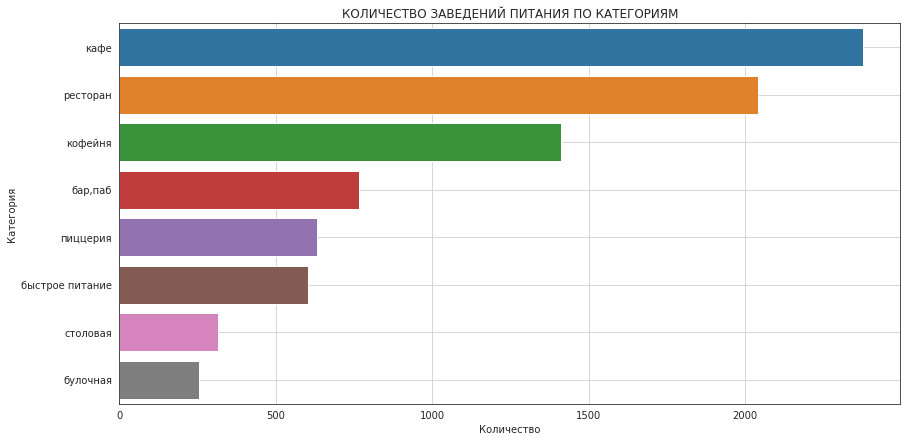

In [12]:
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(14, 7))
# строим столбчатый график средствами seaborn
sns.barplot(x='address', y='category', data=categories)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('КОЛИЧЕСТВО ЗАВЕДЕНИЙ ПИТАНИЯ ПО КАТЕГОРИЯМ')
plt.xlabel('Количество')
plt.ylabel('Категория')
# поворачиваем подписи значений по оси X на 45 градусов
#plt.xticks(rotation=45)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [13]:
fig = go.Figure(data = [go.Pie(labels=categories['category'], values=categories['address'])]) 
fig.update_layout(#legend_orientation="h",
                  legend=dict(x=1.0, xanchor="right"),
                  title="Распределение заведений питания по категориям",
                  #xaxis_title="x Axis Title",
                  #yaxis_title="y Axis Title",
                  margin=dict(l=0, r=0, t=80, b=0))
fig.show()

Среди заведений общественного питания Москвы большую часть составляют кафе - 28%, рестораны 24,3% и кофейни 16,8%. Все остальные категории не превышают 10%-ый порог.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Графики подобраны верно, оформлены корректно, вывод логичен. Принято!
</div>

### 3.2. Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [14]:
seats = data.pivot_table(index='category',values='seats',aggfunc='median'). \
sort_values(by='seats',ascending=False).reset_index()
seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [15]:
fig = px.bar(seats, x='category', y='seats', title='График')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='МЕДИАННОЕ КОЛИЧЕСТВО ПОСАДОЧНЫХ МЕСТ В ЗАВЕДЕНИЯХ ПИТАНИЯ ПО КАТЕГОРИЯМ',
                 xaxis_title='Категория',
                 yaxis_title='Посадочные места')

fig.show() 

Топ-3 категории по количеству посадочных мест: рестораны, бары  и кофейни. При открытии заведений такого плана нужно учесть, что придётся искать просторное помещение, способное вместить не менее 80 человек. Если же площадь помещения позволяет разместить около 50 человек, то оно будет оптимально для булочной или пиццерии.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Принято! За медиану отдельный 👍!
</div>

### 3.3. Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [16]:
chains = data.pivot_table(index='chain',values='address',aggfunc='count').reset_index()
chains

,chain,address
0,0,5201
1,1,3205


In [17]:
chains.loc[0,['chain']] = "не сетевой"
chains.loc[1,['chain']] = "сетевой"
chains

,chain,address
0,не сетевой,5201
1,сетевой,3205


In [18]:
fig = go.Figure(data = [go.Pie(labels=chains['chain'], values=chains['address'])]) 
fig.update_layout(legend=dict(x=1.0, xanchor="right"),
                  title="СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ ПИТАНИЯ",
                  margin=dict(l=0, r=0, t=80, b=0))
fig.show()

Большинство заведений питания (62%) не являются сетевыми.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Супер! Молодец что подписала значения!
</div>

### 3.4.Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [19]:
#sns.set_style('white')
# назначаем размер графика
#plt.figure(figsize=(14, 7))
# строим столбчатый график средствами seaborn
#sns.barplot(x='proportion', y='category', data=categories_chains_proportion)
# формируем заголовок графика и подписи осей средствами matplotlib
#plt.title('Доля сетевых заведений питания по категориям')
#plt.xlabel('Доля')
#plt.xlim=(0,100)
#plt.ylabel('Категория')
# поворачиваем подписи значений по оси X на 45 градусов
#plt.xticks(rotation=45)
# добавляем сетку
#plt.grid()
# отображаем график на экране
#plt.show()

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Сравнивать количество сетевых заведений не очень корректно в этом задании. Так, кафе на первом месте не потому что большинство кафе сетевые, а потому что самих заведений кафе больше всего. Давай лучше сравним долю сетевых заведений в категориях.
</div>

<div class="alert-info">  
Построила новый график и расчёты к нему:
</div>

In [20]:
chains_2 = data.query('chain==1').pivot_table(index='category',values='address',aggfunc='count').reset_index()
chains_2.columns=['category','number_of_chain_rests']
chains_2 #посмотрим количество сетевых заведений по категориям

,category,number_of_chain_rests
0,"бар,паб",169
1,булочная,157
2,быстрое питание,232
3,кафе,779
4,кофейня,720
5,пиццерия,330
6,ресторан,730
7,столовая,88


In [21]:
chains_no_chains = data.pivot_table(index='category',values='address',aggfunc='count').reset_index()
chains_no_chains.columns=['category','number_of_rests']
chains_no_chains #посмотрим количество всех заведений по категориям

,category,number_of_rests
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1413
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [22]:
categories_chains_proportion = chains_2.merge(chains_no_chains, on='category')
categories_chains_proportion #объединим данные в 1 таблицу

,category,number_of_chain_rests,number_of_rests
0,"бар,паб",169,765
1,булочная,157,256
2,быстрое питание,232,603
3,кафе,779,2378
4,кофейня,720,1413
5,пиццерия,330,633
6,ресторан,730,2043
7,столовая,88,315


In [23]:
categories_chains_proportion['proportion_chain'] = round((categories_chains_proportion['number_of_chain_rests'] / \
categories_chains_proportion['number_of_rests'])* 100,2)

categories_chains_proportion['proportion_not_chain'] = 100 - categories_chains_proportion['proportion_chain']
categories_chains_proportion['proportion_all']= 100

categories_chains_proportion #найдём пропорции для каждой категории

,category,number_of_chain_rests,number_of_rests,proportion_chain,proportion_not_chain,proportion_all
0,"бар,паб",169,765,22.09,77.91,100
1,булочная,157,256,61.33,38.67,100
2,быстрое питание,232,603,38.47,61.53,100
3,кафе,779,2378,32.76,67.24,100
4,кофейня,720,1413,50.96,49.04,100
5,пиццерия,330,633,52.13,47.87,100
6,ресторан,730,2043,35.73,64.27,100
7,столовая,88,315,27.94,72.06,100


In [24]:
table_sorted_new = categories_chains_proportion.drop(columns = ['number_of_chain_rests','number_of_rests',\
                                                                'proportion_all'],axis = 1) 
table_sorted_new.columns=['category','сетевые заведения','не сетевые заведения']
table_sorted_new = table_sorted_new.sort_values(by='сетевые заведения')#сосавим датасет, где будут только пропорции
table_sorted_new

,category,сетевые заведения,не сетевые заведения
0,"бар,паб",22.09,77.91
7,столовая,27.94,72.06
3,кафе,32.76,67.24
6,ресторан,35.73,64.27
2,быстрое питание,38.47,61.53
4,кофейня,50.96,49.04
5,пиццерия,52.13,47.87
1,булочная,61.33,38.67


In [25]:
chain_name = ['сетевые заведения','не сетевые заведения']
fig = px.bar(table_sorted_new, x=table_sorted_new['category'], y=chain_name, text= 'value', \
width=1000, height=850,title="ДОЛЯ СЕТЕВЫХ ЗАВЕДЕНИЙ В ТОЧКАХ ОБЩЕСТВЕННОГО ПИТАНИЯ ПО КАТЕГОРИЯМ")
fig.update_layout(legend_title = ' ',yaxis_title=' ', xaxis_title='Категории')
fig.update_xaxes(categoryorder='total descending')#сортировка по убыванию доли сетей
fig.show() #построим график

Топ-3 категории по доле сетевых заведений:
- булочные - 61% здесь составляют сети,
- пиццерии - 52% сетей,
- кофейни - 51%.

А вот среди баров доля сетей составляет всего 22%.


<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера V2:</b>
    
Супер! Только давай сделаем сортировку. Сортировка поможет сделать твои результаты читаемее и нагляднее.

Сортировка в plotly <a href='https://plotly.com/python/categorical-axes/'>описана тут</a>, а в seaborn <a href='https://seaborn.pydata.org/tutorial/categorical.html'>тут</a> и <a href='https://www.python-graph-gallery.com/35-control-order-of-boxplot'>тут</a>.
</div>

<div class="alert-info">  
Добавила сортировку: категории заведений отсортированы по доле сетей.Спасибо за ссылочки - не обращала внимание, что сортировку можно в самом графике делать, а не только в таблице!
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V3:</b>

Принято!
</div>

### 3.5. Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.

#### 3.5.1. Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию.

In [26]:
chains_3 = data.query('chain==1').pivot_table(index='name',values='address',aggfunc='count'). \
sort_values(by='address',ascending=False).head(15).reset_index()
chains_3.columns=['name','number_of_rests']
chains_3 # Найдём топ-15 популярных сетей Москвы (*популярность в данном случае определяем количеством заведений в сети)

,name,number_of_rests
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [27]:
fig = go.Figure(data = [go.Pie(labels=chains_3['name'], values=chains_3['number_of_rests'])]) 
fig.update_layout(legend=dict(x=1.0, xanchor="right"),
                  title="Топ-15 популярных сетей в Москве по количеству заведений",
                  margin=dict(l=0, r=0, t=80, b=0),
                  legend_orientation="h",)
fig.show()

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Топ 15 сетей найдены корректно!
</div>

Итак,  самая популярная сеть Москвы среди заведений общественного питания -  Шоколадница. В пятёрку лидеров также входят Доминос Пицца, Додо Пицца, One price Coffee и Яндекс Лавка.

In [28]:
top_15_names = list(chains_3['name']) # для дальнейшего анализа выведем cписок топ-15 заведений
top_15_names

['Шоколадница',
 "Домино'с Пицца",
 'Додо Пицца',
 'One Price Coffee',
 'Яндекс Лавка',
 'Cofix',
 'Prime',
 'Хинкальная',
 'КОФЕПОРТ',
 'Кулинарная лавка братьев Караваевых',
 'Теремок',
 'Чайхана',
 'CofeFest',
 'Буханка',
 'Му-Му']

#### 3.5.2. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет?

In [29]:
top_15_general= data.query('name in @top_15_names').pivot_table(index='name',values='rating',aggfunc='median')
top_15_general

,rating
name,
CofeFest,4.05
Cofix,4.10
One Price Coffee,4.20
Prime,4.20
Буханка,4.40
Додо Пицца,4.30
Домино'с Пицца,4.20
КОФЕПОРТ,4.20
Кулинарная лавка братьев Караваевых,4.40


In [30]:
top_15_general['rating'].median()

4.2

Общее у этих заведений в том, что они понимают, как понравиться своему клиенту. У каждой сети питания из рейтинга Топ-15 Москвы медианный рейтинг не ниже 4 по 5-балльной шкале. А общий медианный рейтинг для Топ-15 составляет 4.2. Учитывая капризные столичные нравы, заслужить такой рейтинг стоило большого труда.

#### 3.5.3. К какой категории заведений они относятся?

In [31]:
# Оставим в датасете по одной строке для каждой сети 
data_top_15 = data.query('name in @top_15_names').drop_duplicates(subset='name') 

In [32]:
data_top_15_category = data_top_15['category'].value_counts()
data_top_15_category

кофейня            5
ресторан           3
кафе               3
пиццерия           2
быстрое питание    1
булочная           1
Name: category, dtype: int64

In [33]:
data_top_15_category_df = pd.DataFrame({'category': ['кофейня', 'ресторан', 'кафе', 'пиццерия', 'булочная', \
'быстрое питание'], 'number': [5,3,3,2,1,1]})
data_top_15_category_df

,category,number
0,кофейня,5
1,ресторан,3
2,кафе,3
3,пиццерия,2
4,булочная,1
5,быстрое питание,1


In [34]:
fig = px.bar(data_top_15_category_df, x='category', y='number', title='График')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Топ-15 сетевых точек питания Москвы в разбивке по категориям',
                 xaxis_title='Категория',
                 yaxis_title='Количество')
fig.show() 

Итак, 5 из 15-и самых популярных сетей питания Москвы являются кофейнями. 

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Все верно!
</div>

#### 3.5.4. Отобразите общее количество заведений и количество заведений каждой категории по районам.

In [35]:
data_top_15_quantity = data.query('name in @top_15_names').pivot_table(index='category',values='address',aggfunc='count') \
.reset_index().sort_values(by='address',ascending=False)
data_top_15_quantity

,category,address
4,кофейня,336
6,ресторан,186
5,пиццерия,151
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


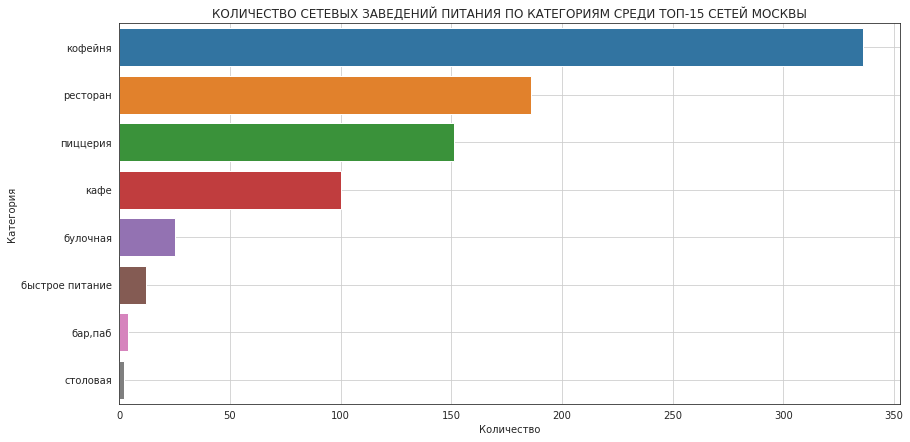

In [36]:
sns.set_style('white')
sns.color_palette('coolwarm', 20)
# назначаем размер графика
plt.figure(figsize=(14, 7))
# строим столбчатый график средствами seaborn
sns.barplot(x='address', y='category', data=data_top_15_quantity)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('КОЛИЧЕСТВО СЕТЕВЫХ ЗАВЕДЕНИЙ ПИТАНИЯ ПО КАТЕГОРИЯМ СРЕДИ ТОП-15 СЕТЕЙ МОСКВЫ')
plt.xlabel('Количество')
plt.ylabel('Категория')
# поворачиваем подписи значений по оси X на 45 градусов
#plt.xticks(rotation=45)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Среди заведений Топ-15 сетей питания поо количеству преобладают кофейни, рестораны и пиццерии.

In [37]:
top_15_district_category= data.query('name in @top_15_names').groupby(['district', 'category'], \
                        as_index = False)[['address']].count()
top_15_district_category.columns=['district','category','quantity']
top_15_district_category.head(5)

,district,category,quantity
0,Восточный административный округ,"бар,паб",2
1,Восточный административный округ,булочная,1
2,Восточный административный округ,быстрое питание,2
3,Восточный административный округ,кафе,6
4,Восточный административный округ,кофейня,30


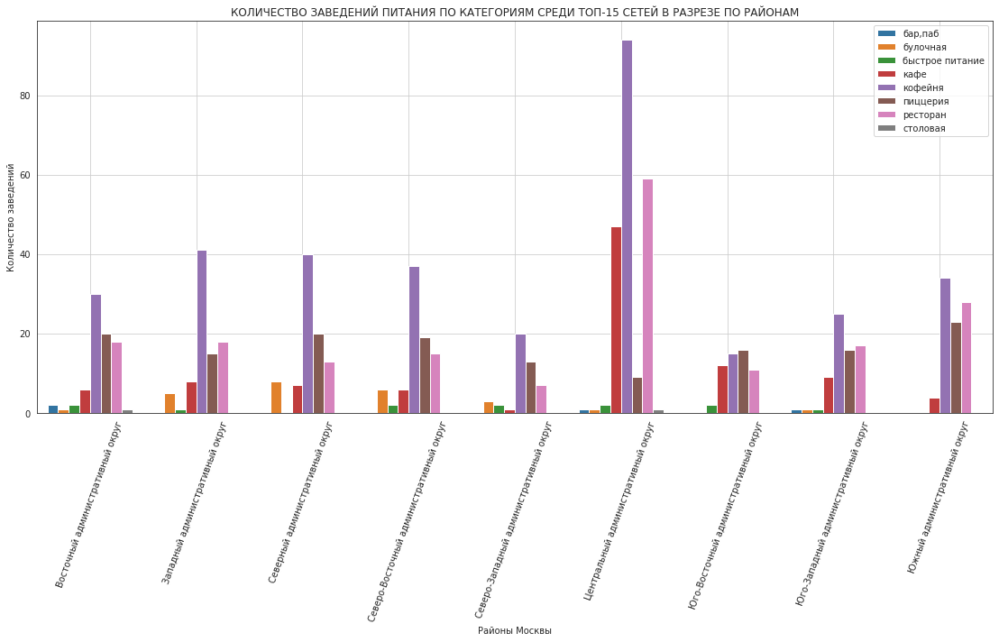

In [38]:
sns.set_style('white')
#sns.set_palette('pastel') 
# назначаем размер графика
plt.figure(figsize=(19, 8))
# строим столбчатый график средствами seaborn
sns.barplot(x='district', y='quantity', data=top_15_district_category,hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('КОЛИЧЕСТВО ЗАВЕДЕНИЙ ПИТАНИЯ ПО КАТЕГОРИЯМ СРЕДИ ТОП-15 СЕТЕЙ В РАЗРЕЗЕ ПО РАЙОНАМ')
plt.xlabel('Районы Москвы')
plt.ylabel('Количество заведений')
#поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=70)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Разбив количество заведений из Топ-15 по районам, мы видим, что практически во всех районах среди категорий точек питания - больше всего кофеен, за исключением Юго-Восточного административного округа - там преобладают пиццерии, и вместо ресторанов в этом районе преобладают кафе.Это неудивительно, район исторически был рабочей окраиной Москвы, поэтому точки питания здесь должны быть максимально бюджетные и питание должно быть сытным.

Почётное второе и третье места, по количеству заведений среди Топ-15, во всех районах Москвы занимают пиццерии и рестораны,за исключением Центральног административного округа, здесь вместо бюждетных пиццериий в тройку лидеров врываются кафе. Следует также отметить, что количество кофеен, ресторанов и кафе в Центральном административном округе в разы больше, чем в любом другом районе. И здесь при открытии заведения питания нужно быть особенно внимательным: уровень конкуренции просто зашкаливает. 

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Принято!
</div>

### 3.6. Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [39]:
data['district'].unique() #перечень районов Москвы, представленных в общем датасете

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [40]:
all_rests_quantity = data.pivot_table(index='category',values='address',aggfunc='count') \
.reset_index().sort_values(by='address',ascending=False)
all_rests_quantity

,category,address
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [41]:
#sns.set_style('white')
#sns.color_palette('coolwarm', 20)
# назначаем размер графика
#plt.figure(figsize=(14, 7))
# строим столбчатый график средствами seaborn
#sns.barplot(x='category', y='address', data=all_rests_quantity)
# формируем заголовок графика и подписи осей средствами matplotlib
#plt.title('Количество заведений питания по категориям')
#plt.xlabel('Категория')
#plt.ylabel('Количество')
# поворачиваем подписи значений по оси X на 45 градусов
#plt.xticks(rotation=45)
# добавляем сетку
#plt.grid()
# отображаем график на экране
#plt.show()

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Этот график в этом задании не совсем к месту. Он полностью повторяет график из первого задания. Давай лучше выведем по оси Х округа, тогда мы сможем оценить сколько заведений в каждом из них. А если сделаешь по таблице all_rests_district_category график staked bar библиотеки Plotly (буквально 2 пример построения такого графика в этой документации: https://plotly.com/python/bar-charts/) результат будет максимально наглядным.
</div>

<div class="alert-info">  
Исправлено:
</div>

In [42]:
table_sorted= data.pivot_table(index='district',columns='category',values='name',aggfunc='count').reset_index()
table_sorted

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


In [43]:
table_sorted_2= data.pivot_table(index='district',values='name',aggfunc='count').reset_index()
table_sorted_2.columns = ['district','общее количество']
table_sorted_2

,district,общее количество
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [44]:
table_sorted_3 = table_sorted.merge(table_sorted_2, on='district')
table_sorted_3 = table_sorted_3.sort_values(by='общее количество',ascending=False)
table_sorted_3 

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,общее количество
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
2,Северный административный округ,68,39,58,235,193,77,189,41,900
8,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
1,Западный административный округ,50,37,62,239,150,71,218,24,851
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [45]:
# строим график
category_name = ['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая']
fig = px.bar(table_sorted_3, x=table_sorted_3['district'] , y=category_name, text= 'value', \
width=1000, height=850,title="Распределение количества заведений по категориям в районах Москвы")
fig.update_layout(legend_title = 'Категории',yaxis_title='Количество заведений', xaxis_title='Районы')
fig.show()

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V2:</b>

Принято!
    
Если честно, этот графим мне нравится гораздо больше чем следующий. Но это вкусовщина.
</div>

ВТОРОЙ ВАРИАНТ:

In [46]:
all_rests_district_category= data.groupby(['district', 'category'], \
                        as_index = False)[['address']].count()
all_rests_district_category.columns=['district','category','quantity']
all_rests_district_category.head(5)

,district,category,quantity
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105


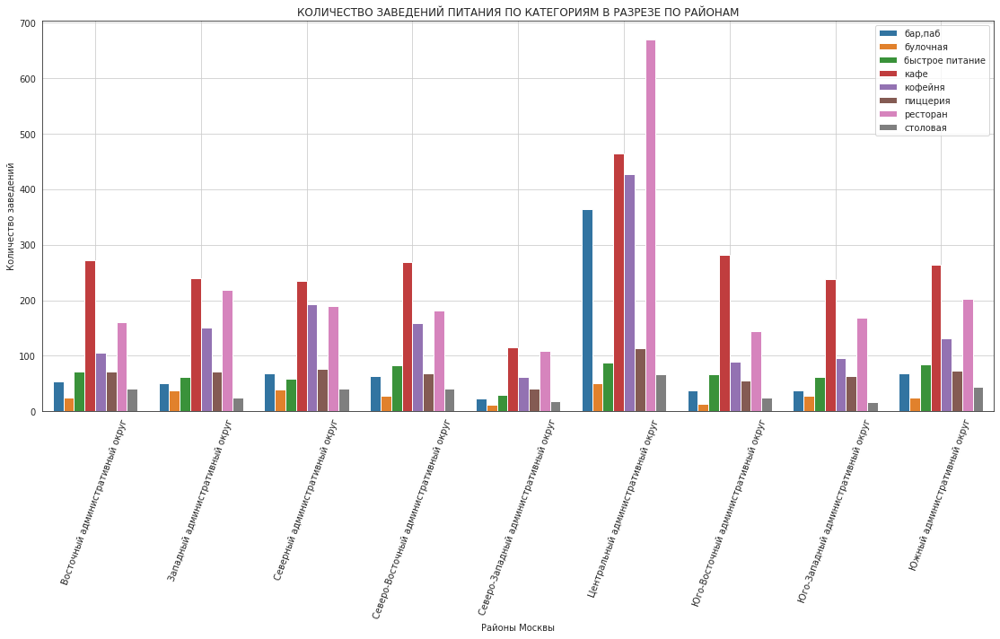

In [47]:
sns.set_style('white')
# sns.set_palette('pastel') 
# назначаем размер графика
plt.figure(figsize=(19, 8))
# строим столбчатый график средствами seaborn
sns.barplot(x='district', y='quantity', data=all_rests_district_category,hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('КОЛИЧЕСТВО ЗАВЕДЕНИЙ ПИТАНИЯ ПО КАТЕГОРИЯМ В РАЗРЕЗЕ ПО РАЙОНАМ')
plt.xlabel('Районы Москвы')
plt.ylabel('Количество заведений')
#поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=70)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Если рассморативать все заведения питания Москвы, а не только топ-15 сетей, то становится очевидным следующее.Самая популярная категория среди заведений питания в представленных 9 районах Москвы это - кафе, за исключением Центрального административного округа - там преобладают рестораны.Также стоит отметить, что в ЦАО к тройке лидеров по количеству заведений приближаются бары/пабы, они занимают здесь почётноое четвёртое место, уверенно оставив за спиной все прочие категории точек питания.

Второе и третье место по количеству заведений во всех районах Москвы составляют рестораны и кафейни. 

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V2:</b>

Задание принято!
</div>

### 3.7. Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [48]:
rating_category = data.pivot_table(index='category',values='rating',aggfunc='mean') \
.reset_index().sort_values(by='rating',ascending=False)
rating_category

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


In [49]:
fig = px.bar(rating_category, x='category', y='rating', title='График',range_y=[4, 4.4])
fig.update_xaxes(tickangle=45)
fig.update_layout(title='СРЕДНИЙ РЕЙТИНГ ЗАВЕДЕНИЙ ПИТАНИЯ МОСКВЫ В РАЗРЕЗЕ ПО  КАТЕГОРИЯМ',
                 xaxis_title='Категория',
                 yaxis_title='Рейтинг')
fig.show() 

Средний рейтинг заведений питания Москвы во всех категориях колеблется в пределах от 4.05 у заведений быстрого питания до 4.38 в  категории бары/пабы. Таким образом, усреднённые рейтинги в разных типах общепита отличаются не значительно.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Молодец что установила лимит на ось Рейтинга!
</div>

Сравним рейтинг заведений питания другим методом. Построим «график-скрипку» методом violinplot() из библиотеки seaborn. Такой график включает все параметры, которые показывает «ящик с усами», и отображает форму гистограммы:

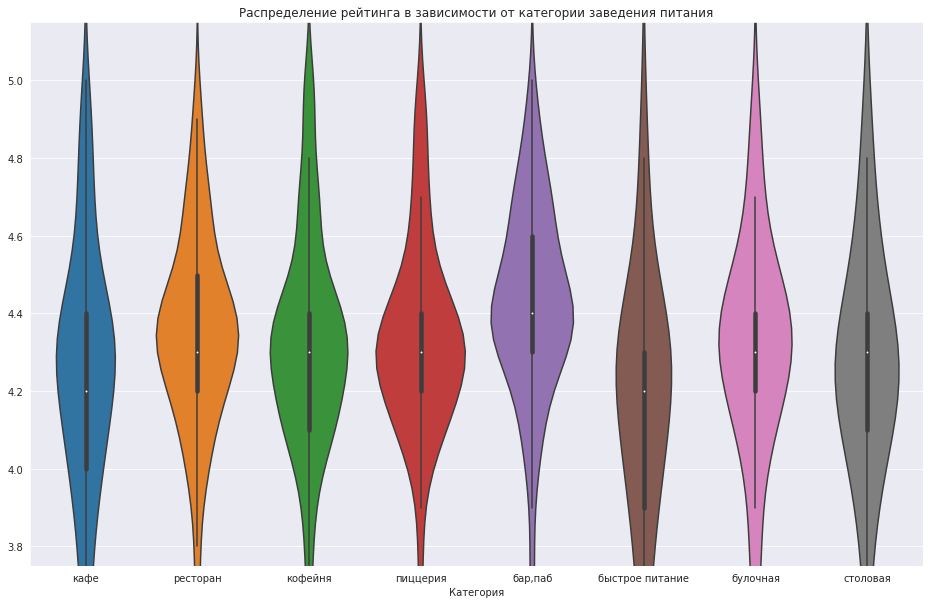

In [50]:
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
plt.figure(figsize=(16, 10))
# строим график violinplot средствами seaborn
sns.violinplot(x='category', y='rating', data=data)
# ограничиваем ось X для наглядности
plt.ylim(3.75, 5.15)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение рейтинга в зависимости от категории заведения питания')
plt.xlabel('Категория')
plt.ylabel(None)
# отображаем график на экране
plt.show()

Распределения похожи, рейтинги заведений в зависимости от категорий действительно различается незначительно. Из графика также очевидно, что владельцам заведений быстрого питания есть над чем поработать, а вот бары/пабы уже сейчас максимально оправдывают ожидания клиента.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Принято!
</div>

### 3.8. Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [51]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [52]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='СРЕДНИЙ РЕЙТИНГ ЗАВЕДЕНИЙ ПО РАЙОНАМ',
).add_to(m)

# выводим карту
m

Самые высокий средний рейтинг у заведений питания Москвы в Центральном административном округе, а самый низкий - в Юго-Восточном административном округе.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Принято!
</div>

### 3.9. Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Визуализация корректна!
</div>

### 3.10. Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [54]:
streets = data.pivot_table(index='street',values='address',aggfunc='count'). \
sort_values(by='address',ascending=False).head(15).reset_index()
streets.columns=['street','number_of_rests']
streets # Найдём топ-15 улиц Москвы по количеству заведений общественного питания

,street,number_of_rests
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [55]:
top_15_streets = list(streets['street']) # топ-15 улиц по количеству заведений
top_15_streets

['проспект Мира',
 'Профсоюзная улица',
 'проспект Вернадского',
 'Ленинский проспект',
 'Ленинградский проспект',
 'Дмитровское шоссе',
 'Каширское шоссе',
 'Варшавское шоссе',
 'Ленинградское шоссе',
 'МКАД',
 'Люблинская улица',
 'улица Вавилова',
 'Кутузовский проспект',
 'улица Миклухо-Маклая',
 'Пятницкая улица']

In [56]:
streets_category= data.query('street in @top_15_streets').groupby(['street', 'category'], \
                        as_index = False)[['address']].count()
streets_category.columns=['street','category','quantity']
streets_category.head(5)

,street,category,quantity
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4


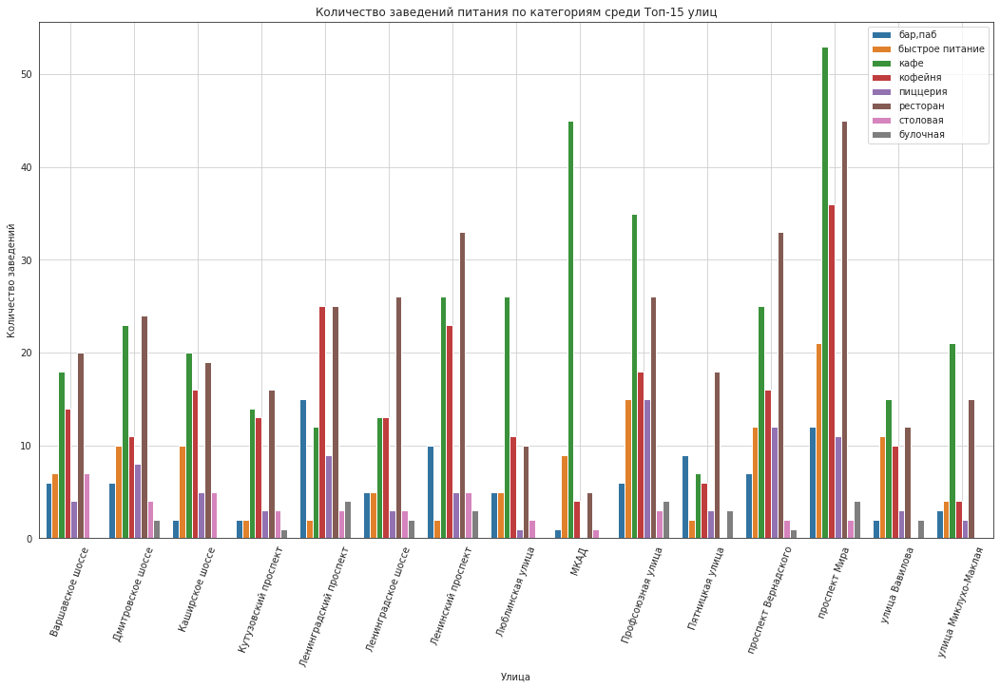

In [57]:
sns.set_style('white')
# sns.set_palette('pastel') 
# назначаем размер графика
plt.figure(figsize=(18, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='street', y='quantity', data=streets_category,hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений питания по категориям среди Топ-15 улиц')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
#поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=70)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Среди топ-15 улиц Москвы по количеству заведений общественного питаниия, наиболее часто встречаются 2 категории: кафе и рестораны.
Затем идут кофейни - на большинстве улиц из Топ-15 эта категория занимает почётное третье место.

Среди улиц, по количеству заведений во всех категориях - лидирует проспект Мира.

Также выделяется МКАД, особенность этой улицы, что абсолютное большинтсво точек общественного питания, расположенных на данной уице относятся к категории кафе; на второе место именно здесь выходят точки быстрого питания. 

Подкрепим полученные наблюдения, используя второй способ визуализации:

In [58]:
str_category = data.query('street in @top_15_streets').pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count').reset_index()
str_category 

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
1,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
2,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
3,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
6,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
7,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
8,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0


In [59]:
# отобразим общее количество заведений по районам
rests_on_top_15_streets = data.query('street in @top_15_streets').groupby('street')['address'].count()
rests_on_top_15_streets

street
Варшавское шоссе           76
Дмитровское шоссе          88
Каширское шоссе            77
Кутузовский проспект       54
Ленинградский проспект     95
Ленинградское шоссе        70
Ленинский проспект        107
Люблинская улица           60
МКАД                       65
Профсоюзная улица         122
Пятницкая улица            48
проспект Вернадского      108
проспект Мира             184
улица Вавилова             55
улица Миклухо-Маклая       49
Name: address, dtype: int64

In [60]:
# объединим таблицы с количеством заведений каждой категории и общим количеством заведений
total_str_category = str_category.merge(rests_on_top_15_streets, on='street')
total_str_category.columns = ['Улица', 'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая','Общее количество заведений']
total_str_category = total_str_category.sort_values(by='Общее количество заведений',ascending=False)
total_str_category

,Улица,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Общее количество заведений
12,проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
11,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108
6,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
1,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
2,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
0,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76
5,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70
8,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0,65


In [61]:
# строим график
category_name = ['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая']
street_name = total_str_category['Улица']
fig = px.bar(total_str_category, x=street_name, y=category_name, text= 'value', \
width=1000, height=850,title="Распределение количества заведений по категориям на Топ-15 улицах Москвы")
fig.update_layout(legend_title = 'Категории',yaxis_title='Количество заведений', xaxis_title='Улицы')
fig.show()

Второй способ визуализации также подтвердил, что среди топ-15 улиц Москвы по количеству заведений общественного питаниия, наиболее часто встречаются 2 категории: кафе и рестораны.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Принято!
</div>

### 3.11. Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [62]:
streets_1 = data.pivot_table(index='street',values='address',aggfunc='count'). \
sort_values(by='address',ascending=True).reset_index()
streets_1.columns=['street','number_of_rests']
streets_1

,street,number_of_rests
0,1-й Автозаводский проезд,1
1,Одинцовская улица,1
2,Октябрьский переулок,1
3,Ордынский тупик,1
4,Оренбургская улица,1
...,...,...
1443,Ленинградский проспект,95
1444,Ленинский проспект,107
1445,проспект Вернадского,108
1446,Профсоюзная улица,122


In [63]:
streets_1_sorted = streets_1.query('number_of_rests==1')
streets_1_sorted

,street,number_of_rests
0,1-й Автозаводский проезд,1
1,Одинцовская улица,1
2,Октябрьский переулок,1
3,Ордынский тупик,1
4,Оренбургская улица,1
...,...,...
453,3-й Хорошёвский проезд,1
454,Бобров переулок,1
455,Богословский переулок,1
456,4-й Лесной переулок,1


In [64]:
streets_1_list = list(streets_1_sorted['street']) # список улиц с 1 заведением общественного питания

In [65]:
streets_1_rest_category = data.query('street in @streets_1_list')['category'].value_counts()
streets_1_rest_category # Посмотрим, какие категории питания преобладают на улице с 1 заведением общественного питания

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [66]:
streets_1_rest_category_df = pd.DataFrame({'category': ['кафе','ресторан','кофейня','бар/паб','столовая','быстрое питание', \
'пиццерия','булочная'], 'number': [160,93,84,39,36,23,15,8]})
streets_1_rest_category_df

,category,number
0,кафе,160
1,ресторан,93
2,кофейня,84
3,бар/паб,39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [67]:
fig = go.Figure(data = [go.Pie(labels=streets_1_rest_category_df['category'], values=streets_1_rest_category_df['number'])]) 
fig.update_layout(#legend_orientation="h",
                  legend=dict(x=1.0, xanchor="right"),
                  title="Распределение заведений питания,расположенных одних на улице, по категориям",
                  #xaxis_title="x Axis Title",
                  #yaxis_title="y Axis Title",
                  margin=dict(l=0, r=0, t=80, b=0))
fig.show()

На улицах, где расположено всего 1 заведение общественного питания преобладают кафе (34%),рестораны (20%) и кофейни (18%).

In [68]:
streets_1_rest_rating = data.query('street in @streets_1_list')['rating'].value_counts()
streets_1_rest_rating # Посмотрим, какой рейтинг чаще всего встречается у заведений общественного питания,
#расположенных на улице, где нет конкурентов

4.3    84
4.4    56
4.2    54
4.1    49
4.5    28
4.7    28
4.0    25
4.6    21
4.9    19
3.9    15
4.8    12
3.8    12
5.0    11
3.7     9
3.3     5
3.6     5
3.5     4
2.8     4
3.0     4
2.9     3
3.4     3
3.2     2
2.7     1
1.0     1
2.6     1
1.4     1
3.1     1
Name: rating, dtype: int64

In [69]:
streets_1_rest_rating_df = pd.DataFrame({'rating': ['4.3',
'4.4',    
'4.2',    
'4.1',   
'4.5',   
'4.7',    
'4.0',    
'4.6',    
'4.9',    
'3.9',    
'4.8',    
'3.8',    
'5.0',    
'3.7',    
'3.3',     
'3.6',     
'3.5',     
'2.8',     
'3.0',     
'2.9',     
'3.4',    
'3.2',    
'2.7',     
'1.0',     
'2.6',     
'1.4',     
'3.1' ], 
'frequency': [ 84,
56,
54,
49,
28,
28,
25,
21,
19,
15,
12,
12,
11,
9,
5,
5,
4,
4,
4,
3,
3,
2,
1,
1,
1,
1,
1]})
streets_1_rest_rating_df = streets_1_rest_rating_df.sort_values(by='rating',ascending=True).reset_index(drop=True)
streets_1_rest_rating_df

,rating,frequency
0,1.0,1
1,1.4,1
2,2.6,1
3,2.7,1
4,2.8,4
5,2.9,3
6,3.0,4
7,3.1,1
8,3.2,2
9,3.3,5


In [70]:
fig = go.Figure(data = [go.Pie(labels=streets_1_rest_rating_df['rating'], values=streets_1_rest_rating_df['frequency'])]) 
fig.update_layout(#legend_orientation="h",
                  legend=dict(x=1.0, xanchor="right"),
                  title="Распределение заведений питания,расположенных одних на улице, по категориям",
                  #xaxis_title="x Axis Title",
                  #yaxis_title="y Axis Title",
                  margin=dict(l=0, r=0, t=80, b=0))
fig.show()

На улицах, где расположено всего 1 заведение общественного питания, в большинстве своём расположены заведения с хорошим рейтингом -  не ниже 4. Топ 5 рейтингов для таких заведений питания: рейтинг 4.3 у 18%  точек общепита, рейтинг 4.4 - у 12.2%, рейтинг 4.2 -  у  11.8% заведений.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Согласен!
</div>

### 3.12. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [71]:
middle_avg_bill_df = data.groupby('district',as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_df['middle_avg_bill'] = middle_avg_bill_df['middle_avg_bill'].round()
middle_avg_bill_df

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [72]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data= state_geo,
    data= middle_avg_bill_df,
    columns= ['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

В Центральном и Западном административных округах медианное значение среднего чека самое высокое, что не удивительно - мы в самом центре столицы. Впрочем, есть и удалённые районы, где ценник один из самых высоких - это аэропорт Внуково, район инновационного центра Сколково, и престижные загородные районы - Солнцево, Ново-Переделкино.  
Внутри МКАД самый низкий ценник мы видим в  Южном, Юго-Восточном, и Северо-Восточном административных округах.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Все верно!
</div>

### 3.13. Соберите наблюдения по вопросам выше в один общий вывод.

При анализе заведений общественного питания Москвы удалось выявить следующие закономерности:
- Среди заведений общественного питания Москвы большую часть составляют кафе - 28%, рестораны 24,3% и кофейни 16,8%. Все остальные категории не превышают 10%-ый порог.
- Большинство заведений питания (62%) не являются сетевыми.
- Топ-3 категории по доле сетевых заведений: булочные(61%),пиццерии(52%),кофейни(51%). А вот среди баров доля сетей составляет всего 22%.
- Топ-3 категории по количеству посадочных мест: рестораны, бары  и кофейни. При открытии заведений такого плана нужно учесть, что придётся искать просторное помещение, способное вместить не менее 80 человек. Если же площадь помещения позволяет разместить около 50 человек, то оно будет оптимально для булочной или пиццерии.
- Самая популярная сеть  среди заведений общественного питания Москвы -  Шоколадница. В пятёрку лидеров также входят Доминос Пицца, Додо Пицца, One price Coffee и Яндекс Лавка. В ходе исследования выявлено, что 5 из 15-и самых популярных сетей питания Москвы являются кофейнями. Общий медианный рейтинг заведений питаания у  Топ-15 сетей составляет 4.2 по 5-балльной шкале.
- Самая популярная категория среди заведений питания в представленных 9 районах Москвы это - кафе, за исключением Центрального административного округа - там преобладают рестораны.Также стоит отметить, что в ЦАО к тройке лидеров по количеству заведений приближаются бары/пабы, они занимают здесь почётноое четвёртое место, уверенно оставив за спиной все прочие категории точек питания.Второе и третье место по количеству заведений во всех районах Москвы составляют рестораны и кафейни.
- Средний рейтинг заведений питания Москвы во всех категориях колеблется в пределах от 4.05 у заведений быстрого питания до 4.38 в  категории бары/пабы. Таким образом, усреднённые рейтинги в разных типах общепита отличаются не значительно.
- Самые высокий средний рейтинг у заведений питания Москвы в Центральном административном округе, а самый низкий - в Юго-Восточном административном округе.
- Выявлено ТОП-15 улиц Москвы, где расположено больше всего объектов питания: проспект Мира,Профсоюзная улица,проспект Вернадского,Ленинский проспект,Ленинградский проспект,Дмитровское шоссе,Каширское шоссе,Варшавское шоссе,Ленинградское шоссе,МКАД,Люблинская улица,улица Вавилова,Кутузовский проспект,улица Миклухо-Маклая,Пятницкая улица. На этих улицах наиболее часто встречаются 2 категории заведений общественного питания: кафе и рестораны, затем идут кофейни. Улица-лидер по количеству заведений общественного питания - проспект Мира.
- Как выяснилось, в Москве есть немало улиц, где находится всего 1 заведение общественного питания.И что примечательно, средний рейтинг этих заведений - не ниже 4. 




<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Вывод необходимо скорректировать после внесения изменений.
</div>

<div class="alert-info">  
Вывод скорректирован
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V2:</b>

Спасибо!
</div>

## Шаг 4. Детализируем исследование: открытие кофейни

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Постройте визуализации.

Попробуйте дать рекомендацию для открытия нового заведения.

Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

In [73]:
coffe = data.query('category == "кофейня"')['address'].count()
coffe #Всего в датасете 1413 кофеен

1413

In [74]:
coffe_df = data.query('category == "кофейня"').groupby('district',as_index=False)['address'].agg('count')
coffe_df

,district,address
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [75]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data= state_geo,
    data= coffe_df,
    columns= ['district', 'address'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Вне всяякого сомнения,абсолютным лидером по количеству кофеен становится Центральный административный район. Офисные работники, спешащие в офис или туристы, позирующие на фоне досопримечательностей в холодную погоду - всем нужен бодрящий горячий кофе.

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера:</b>

Согласен.
</div>

In [76]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,work_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


In [77]:
coffe_24_7 = data.query('category == "кофейня" and work_24_7 == True')['address'].count() # 
coffe_24_7 # выведем количество круглосуточных кофеен

59

In [78]:
(coffe_24_7/coffe)*100

4.175513092710545

4% московских кофеен являются круглосуточными.

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
Давай перепроверим, круглосуточные кофейни есть.
</div>

<div class="alert-info">  
Исправлено.
</div>

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера V2:</b>

Код верный, нужно только поправить код столбца work_24_7 и скорректировать вывод здесь.
</div>

<div class="alert-info">  
 Исправила.Извиняюсь, на этом задании меня клинануло дважды...
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V3:</b>

Теперь все верно!
</div>

In [79]:
coffe_rating = data.query('category == "кофейня"').groupby('district',as_index=False)['rating'].agg('median')
coffe_rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Поразительно единство: медианный рейтинг кофеен Москвы не отличается по-районам (чуть-чуть уступает Западный АО).

In [80]:
coffe_price = data.query('category == "кофейня"').groupby('district',as_index=False)['middle_coffee_cup'].agg('median')
coffe_price

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [81]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data= state_geo,
    data= coffe_price,
    columns= ['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино по районам Москвы',
).add_to(m)

# выводим карту
m

Рекомендации по открытию кофейни.

Исследовано 3 фактора  в разрезе по районам города: рейтинг кофеен, количество кофеен в районе и медианная стоимость чашки капучино.

Примерно все кофейни вышли на одинаковый уровень сервиса, и рейтинг кофеен во всех районах города - 4.3.
Если смотреть ещё на 2 показателя: количество кофеен в районе и медианная стоимость чашки капучино, то замечаешь следующее.  Количество кофеен в Юго-Западном район Москвы одно из наименьших в городе, при этом медианная стоимость чашки капучино - на уровне Центрального района.
Имея на руках только эти показатели, я рекомендую остановить свой выбор при открытии кофейни на Юго-Западном районе Москвы.
Но здесь конечно нужно дополнительно изучить предложения по аренде недвижимости.

Стоимость чашки капучино в новой кофейне при окрытии должна соответствовать ценовой категории этого района и быть в пределах 190р., что на 2.5% ниже медианной стоимости по району. 



## Шаг 5. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков.
Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате:

Презентация: https://drive.google.com/drive/folders/1uGM0CHuD8Gld0SXHihA8BLbAJRX0A2-y

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера:</b>
    
К презентации нет доступа. К сожалению, не могу проверить. 😢 Предоставь, пожалуйста, доступ всем у кого есть ссылка.
</div>

<div class="alert alert-danger">
    <b>❌ Комментарий ревьюера V2:</b> 

Презентация важный пункт в данном проекте. После учета следующих рекомендаций презентация станет лучше и я смогу её принять:
- Прикрепи, пожалуйста, именно ссылку на презентацию, а не на папку с ней.
- Не указан автор и предмет исследования (о чем это исследование?). Укажи, пожалуйста.
- Давай в начале презентации укажем краткие выводы (например, "Кафе - самая популярная категория заведения", "Несетевых заведений больше чем сетевых", "Самые крупные сети работают в категории кофейни"), а в конце напишем рекомендации.
- Презентацию необходимо скорректировать после внесения изменений в проект

В целом, мне понравилась презентация!
</div>

<div class="alert alert-warning">
    <b>⚠️ Комментарий ревьюера V3:</b>

В конце ты написала скорее выводы, а не рекомендации. Лучшим вариантом было бы в начале написать выводы, а в конце рекомендации (какой район выбираем для отркытия кофейни, какую стоимость цашки установим).
</div>

<div class="alert alert-success">
    <b>✅ Комментарий ревьюера V3:</b>

Критичных замечаний нет, а значит я принимаю проект! 🎉
    
Успехов в дальнейшем обучении!
</div>